In [1]:
!apt-get update
!apt install -y libgl1-mesa-glx

Hit:1 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:4 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Reading package lists... Done
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgl1-mesa-glx is already the newest version (20.0.8-0ubuntu1~18.04.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [2]:
!pip install opencv-python

In [3]:
# import library
import torch
import torchvision
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [4]:
# get three pictures for each class

csv_file_path = "path and labels.csv" # image_path와 class가 적힌 csv file.
df = pd.read_csv(csv_file_path, index_col = 0)

group = df.groupby(df["class"])
path_needed = []
for i in range(18):
    path_needed += group.get_group(i).values[[10,20,30]].tolist()

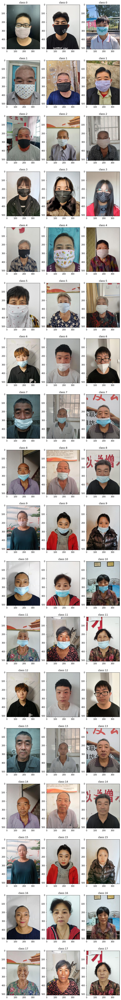

In [26]:
# show Images before face detection

rows_subplot = 18
columns_subplot = 3
fig = plt.figure(figsize=(10, 90))

ax = []

for i in range(rows_subplot * columns_subplot):
    img = Image.open(path_needed[i][0]).convert("RGB")
    ax.append(fig.add_subplot(rows_subplot, columns_subplot, i+1))
    ax[-1].set_title("class:"+str(path_needed[i][1]))
    plt.imshow(img)
    
plt.show()

In [5]:
# get classifiers

eyes_detector = cv2.CascadeClassifier('eyes_xml.xml')
face_detector = cv2.CascadeClassifier('frontal_xml.xml')

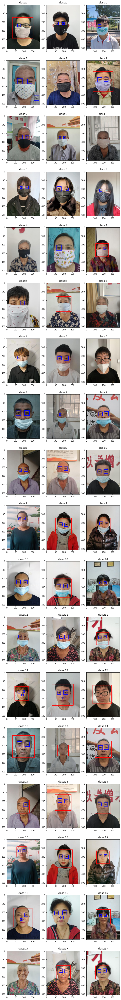

[121, 63, 50, 32, 26, 8]
[465, 186, 147, 97, 86, 37]


In [28]:
# show images after detection, but only with scaledFactor = 1.1

rows_subplot = 18
columns_subplot = 3
fig = plt.figure(figsize=(10, 90))

ax = []

for i in range(rows_subplot * columns_subplot):
    img = np.array(Image.open(path_needed[i][0]).convert("RGB"))
    img_in_gray = np.array(Image.open(path_needed[i][0]).convert("L"))
    
    scale_factors = [1.1]
    face_locss = []
    eyes_locss = []
    
    for scale_factor in scale_factors:
        face_locss.append(face_detector.detectMultiScale(img_in_gray, minSize = (90,90), minNeighbors = 10, scaleFactor = scale_factor))
        eyes_locss.append(eyes_detector.detectMultiScale(img_in_gray, scaleFactor = scale_factor))
    
    for face_locs in face_locss:
        for (x,y,w,h) in face_locs:
            img = cv2.rectangle(img,(x,y),(x+w,y+h), (255,0,0), 3)
            
    for eyes_locs in eyes_locss:
        for (x,y,w,h) in eyes_locs:
            img = cv2.rectangle(img,(x,y),(x+w,y+h), (0,0,255) , 3)

    
    ax.append(fig.add_subplot(rows_subplot, columns_subplot, i+1))
    ax[-1].set_title("class:"+str(path_needed[i][1]))
    plt.imshow(img)
    
plt.show()

print(face_is_detected)
print(eyes_is_detected)

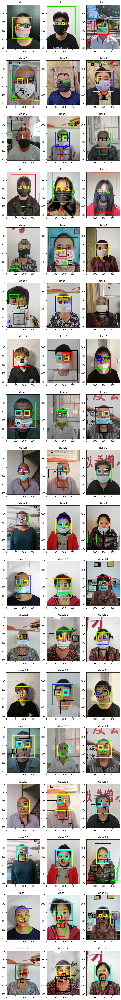

[95, 63, 50, 32, 26, 8]
[379, 186, 147, 97, 86, 37]


In [8]:
# show images after detection, but with different scaleFactors

rows_subplot = 18
columns_subplot = 3
fig = plt.figure(figsize=(10, 90))

ax = []

face_is_detected = [0]*6
eyes_is_detected = [0]*6

colors = [(0,0,0),(255,0,0),(0,255,0),(0,0,255),(255,255,0),(0,255,255)]

for i in range(rows_subplot * columns_subplot):
    img = np.array(Image.open(path_needed[i][0]).convert("RGB"))
    img_in_gray = np.array(Image.open(path_needed[i][0]).convert("L"))
    
    scale_factors = [1.001, 1.005, 1.01, 1.05, 1.1, 1.5]
    face_locss = []
    eyes_locss = []
    
    for scale_factor in scale_factors:
        face_locss.append(face_detector.detectMultiScale(img_in_gray, minSize = (90,90), minNeighbors = 10, scaleFactor = scale_factor))
        eyes_locss.append(eyes_detector.detectMultiScale(img_in_gray, scaleFactor = scale_factor))
    
    for ind, (face_locs, color) in enumerate(zip(face_locss,colors)):
        for (x,y,w,h) in face_locs:
            img = cv2.rectangle(img,(x,y),(x+w,y+h), color, 3)
            face_is_detected[ind] += 1
            
    for ind, (eyes_locs, color) in enumerate(zip(eyes_locss,colors)):
        for (x,y,w,h) in eyes_locs:
            img = cv2.rectangle(img,(x,y),(x+w,y+h), color, 3)
            eyes_is_detected[ind] += 1

    
    ax.append(fig.add_subplot(rows_subplot, columns_subplot, i+1))
    ax[-1].set_title("class:"+str(path_needed[i][1]))
    plt.imshow(img)
    
plt.show()

print(face_is_detected)
print(eyes_is_detected)